In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Lambda, Input, Dense, Conv2D, Conv2DTranspose, Flatten, Reshape, MaxPooling2D, Dropout, BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras.losses import binary_crossentropy, mean_squared_error
from tensorflow.keras import backend as K
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
import torch
import torch.nn as nn
import time
import os
import cv2
import random
import warnings
warnings.simplefilter('ignore')
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import torch.nn.functional as F
from PIL import Image
import torch
import torchvision
import torch.nn as nn
import torch.nn.functional as F
from torchvision.datasets import ImageFolder
import torchvision.transforms as tt
from torch.utils.data import DataLoader
from torchvision.utils import make_grid,save_image
import cv2
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
!rm -rf '/content/generated'

In [ ]:
Path = "/content/drive/MyDrive/DL/PROYECTO 2/pokemon_jpg"

image_size = 64
batch_size = 64
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

train_ds = ImageFolder(Path,transform=tt.Compose([
    tt.Resize(image_size),
    tt.CenterCrop(image_size),
    tt.ToTensor(),
    tt.Normalize(*stats),
    tt.RandomHorizontalFlip(p=0.5)
]))

train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=3, pin_memory=True)

In [ ]:
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

def show_batch(dl, nmax=64):
    for images, _ in dl:
        show_images(images, nmax)
        break

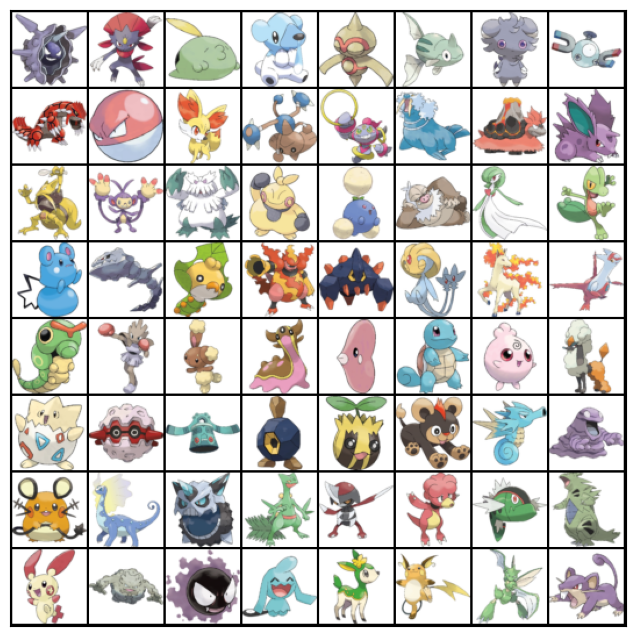

In [ ]:
show_batch(train_dl)


In [ ]:
def get_default_device():
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')

def to_device(data,device):
    if isinstance(data,(list,tuple)):
        return [to_device(x,device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    def __init__(self,dl,device):
        self.dl = dl
        self.device = device
    def __iter__(self):
        for b in self.dl:
            yield to_device(b,device)
    def __len__(self):
        return len(self.dl)

In [ ]:
device = get_default_device()
device

device(type='cuda')

In [ ]:
train_dl = DeviceDataLoader(train_dl, device)

In [2]:
discriminator = nn.Sequential(
    nn.Conv2d(3,64,kernel_size=4,stride=2,padding=1,bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2,inplace=True),

    nn.Conv2d(64,128,kernel_size=4,stride=2,padding=1,bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2,inplace=True),

    nn.Conv2d(128,256,kernel_size=4,stride=2,padding=1,bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2,inplace=True),

    nn.Conv2d(256,512,kernel_size=4,stride=2,padding=1,bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2,inplace=True),

    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),

    nn.Flatten(),
    nn.Sigmoid()
)

In [ ]:
discriminator = to_device(discriminator,device)

In [ ]:
latent_size = 128
generator = nn.Sequential(
    nn.ConvTranspose2d(latent_size,512,kernel_size=4,stride=1,padding=0,bias = False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),

    nn.ConvTranspose2d(512,256,kernel_size=4,stride=2,padding=1,bias = False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),

    nn.ConvTranspose2d(256,128,kernel_size=4,stride=2,padding=1,bias = False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),

    nn.ConvTranspose2d(128,64,kernel_size=4,stride=2,padding=1,bias = False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),

    nn.ConvTranspose2d(64,3,kernel_size=4,stride=2,padding=1,bias = False),
    nn.Tanh()
)

torch.Size([64, 3, 64, 64])


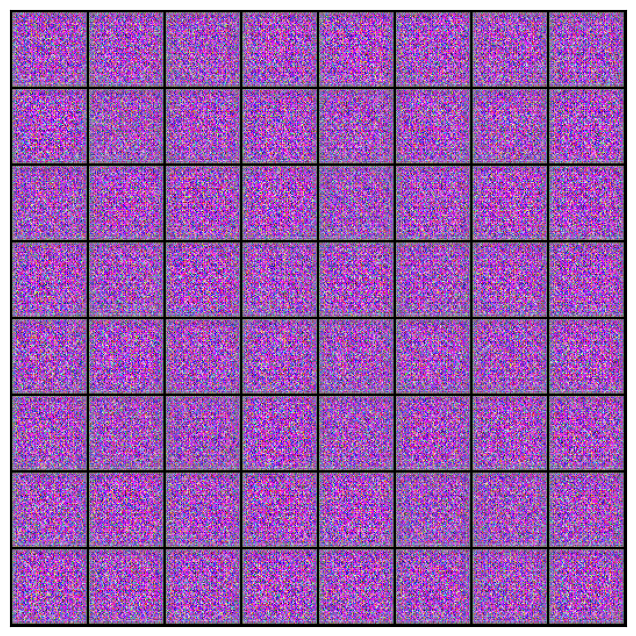

In [ ]:
xb = torch.randn(batch_size, latent_size, 1, 1) # random latent tensors
fake_images = generator(xb)
print(fake_images.shape)
show_images(fake_images)

In [ ]:
generator = to_device(generator,device)

In [ ]:
# CODIGO GENERADO CON CHAT GPT

def train_discriminator(real_images, opt_d):
    # Clear discriminator gradients
    opt_d.zero_grad()

    # Pass real images through discriminator
    real_preds = discriminator(real_images)
    real_targets = torch.ones(real_images.size(0), 1, device=device)
    real_loss = F.binary_cross_entropy(real_preds, real_targets)
    real_score = torch.mean(real_preds).item()

    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Pass fake images through discriminator
    fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
    fake_preds = discriminator(fake_images)
    fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
    fake_score = torch.mean(fake_preds).item()

    # Update discriminator weights
    loss = real_loss + fake_loss
    loss.backward()
    opt_d.step()
    return loss.item(), real_score, fake_score

def train_generator(opt):
    opt.zero_grad()
    latent = torch.randn(batch_size,latent_size,1,1,device=device)
    fake_images = generator(latent)
    preds = discriminator(fake_images)
    targets = torch.ones(batch_size,1,device = device)
    loss = F.binary_cross_entropy(preds,targets)
    loss.backward()
    opt.step()
    return loss.item()

In [ ]:
sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)

In [ ]:
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)

In [ ]:
def save_samples(index, latent_tensors, show=True):
    fake_images = generator(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

Saving generated-images-0000.png


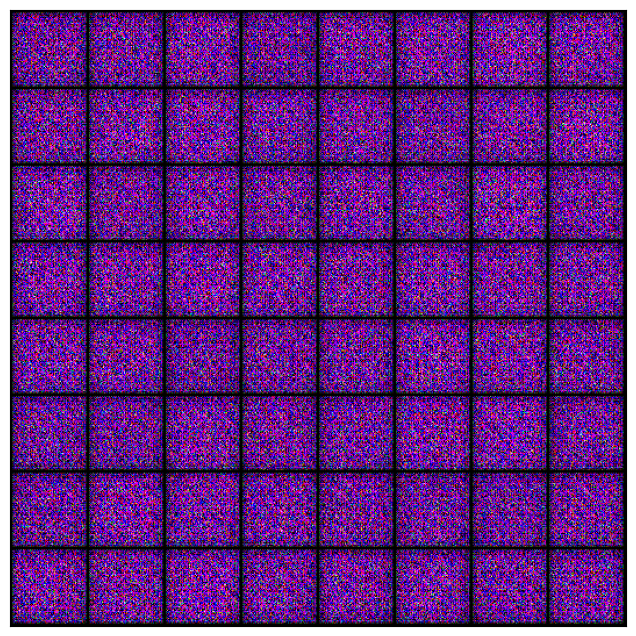

In [ ]:
save_samples(0, fixed_latent)

In [ ]:
def fit(epochs, lr, start_idx=1):
    torch.cuda.empty_cache()

    # Losses & scores
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []

    # Create optimizers
    opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_g = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))

    for epoch in range(epochs):
        for real_images, _ in tqdm(train_dl):
            # Train discriminator
            loss_d, real_score, fake_score = train_discriminator(real_images, opt_d)
            # Train generator
            loss_g = train_generator(opt_g)

        # Record losses & scores
        losses_g.append(loss_g)
        losses_d.append(loss_d)
        real_scores.append(real_score)
        fake_scores.append(fake_score)

        # Log losses & scores (last batch)
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs, loss_g, loss_d, real_score, fake_score))

        # Save generated images
        save_samples(epoch+start_idx, fixed_latent, show=False)

    return losses_g, losses_d, real_scores, fake_scores

In [ ]:
lr = 0.0002
epochs = 500
history = fit(epochs, lr)

  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [1/500], loss_g: 7.8307, loss_d: 0.1617, real_score: 0.8669, fake_score: 0.0015
Saving generated-images-0001.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [2/500], loss_g: 7.4003, loss_d: 0.0075, real_score: 0.9935, fake_score: 0.0009
Saving generated-images-0002.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [3/500], loss_g: 16.9604, loss_d: 0.0138, real_score: 0.9867, fake_score: 0.0000
Saving generated-images-0003.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [4/500], loss_g: 19.0868, loss_d: 0.0027, real_score: 0.9973, fake_score: 0.0000
Saving generated-images-0004.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [5/500], loss_g: 15.0904, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0005.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [6/500], loss_g: 11.5409, loss_d: 4.4196, real_score: 1.0000, fake_score: 0.9754
Saving generated-images-0006.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [7/500], loss_g: 3.8373, loss_d: 0.2389, real_score: 0.9207, fake_score: 0.1381
Saving generated-images-0007.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [8/500], loss_g: 2.0739, loss_d: 0.5408, real_score: 0.7229, fake_score: 0.1249
Saving generated-images-0008.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [9/500], loss_g: 3.7451, loss_d: 0.3025, real_score: 0.9154, fake_score: 0.1865
Saving generated-images-0009.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [10/500], loss_g: 2.1310, loss_d: 0.4943, real_score: 0.7402, fake_score: 0.1517
Saving generated-images-0010.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [11/500], loss_g: 3.8419, loss_d: 0.8808, real_score: 0.4735, fake_score: 0.0143
Saving generated-images-0011.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [12/500], loss_g: 1.0185, loss_d: 1.4379, real_score: 0.2943, fake_score: 0.0303
Saving generated-images-0012.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [13/500], loss_g: 4.8668, loss_d: 0.9392, real_score: 0.9389, fake_score: 0.5590
Saving generated-images-0013.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [14/500], loss_g: 1.8507, loss_d: 0.2837, real_score: 0.9509, fake_score: 0.1943
Saving generated-images-0014.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [15/500], loss_g: 7.1143, loss_d: 0.6225, real_score: 0.9752, fake_score: 0.4331
Saving generated-images-0015.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [16/500], loss_g: 4.0679, loss_d: 0.3258, real_score: 0.8777, fake_score: 0.1493
Saving generated-images-0016.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [17/500], loss_g: 2.5782, loss_d: 0.2628, real_score: 0.9193, fake_score: 0.1512
Saving generated-images-0017.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [18/500], loss_g: 1.2214, loss_d: 0.9693, real_score: 0.4913, fake_score: 0.1038
Saving generated-images-0018.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [19/500], loss_g: 3.1775, loss_d: 0.7982, real_score: 0.8283, fake_score: 0.4083
Saving generated-images-0019.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [20/500], loss_g: 0.6654, loss_d: 1.2813, real_score: 0.3396, fake_score: 0.0245
Saving generated-images-0020.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [21/500], loss_g: 0.8522, loss_d: 0.7111, real_score: 0.5395, fake_score: 0.0414
Saving generated-images-0021.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [22/500], loss_g: 2.4834, loss_d: 0.3046, real_score: 0.8200, fake_score: 0.0885
Saving generated-images-0022.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [23/500], loss_g: 3.9112, loss_d: 0.6733, real_score: 0.9319, fake_score: 0.4313
Saving generated-images-0023.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [24/500], loss_g: 2.6673, loss_d: 0.4297, real_score: 0.8515, fake_score: 0.2194
Saving generated-images-0024.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [25/500], loss_g: 5.7103, loss_d: 1.5169, real_score: 0.9722, fake_score: 0.7481
Saving generated-images-0025.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [26/500], loss_g: 3.9672, loss_d: 0.5336, real_score: 0.8042, fake_score: 0.2523
Saving generated-images-0026.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [27/500], loss_g: 3.6801, loss_d: 0.7953, real_score: 0.8709, fake_score: 0.4393
Saving generated-images-0027.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [28/500], loss_g: 1.1481, loss_d: 0.6896, real_score: 0.6138, fake_score: 0.1383
Saving generated-images-0028.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [29/500], loss_g: 2.4378, loss_d: 0.4312, real_score: 0.8841, fake_score: 0.2385
Saving generated-images-0029.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [30/500], loss_g: 5.3128, loss_d: 0.7704, real_score: 0.9267, fake_score: 0.4681
Saving generated-images-0030.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [31/500], loss_g: 0.9271, loss_d: 1.1657, real_score: 0.3864, fake_score: 0.0449
Saving generated-images-0031.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [32/500], loss_g: 2.9017, loss_d: 0.6248, real_score: 0.7642, fake_score: 0.2708
Saving generated-images-0032.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [33/500], loss_g: 2.5095, loss_d: 0.8959, real_score: 0.4691, fake_score: 0.0309
Saving generated-images-0033.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [34/500], loss_g: 2.8984, loss_d: 0.4361, real_score: 0.8574, fake_score: 0.2252
Saving generated-images-0034.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [35/500], loss_g: 3.0131, loss_d: 0.5222, real_score: 0.8876, fake_score: 0.3095
Saving generated-images-0035.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [36/500], loss_g: 3.2634, loss_d: 0.5137, real_score: 0.7546, fake_score: 0.1716
Saving generated-images-0036.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [37/500], loss_g: 5.0478, loss_d: 0.6370, real_score: 0.9407, fake_score: 0.4089
Saving generated-images-0037.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [38/500], loss_g: 6.3466, loss_d: 0.6702, real_score: 0.8419, fake_score: 0.3686
Saving generated-images-0038.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [39/500], loss_g: 3.4239, loss_d: 0.4473, real_score: 0.9088, fake_score: 0.2751
Saving generated-images-0039.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [40/500], loss_g: 7.2472, loss_d: 1.4363, real_score: 0.9869, fake_score: 0.7204
Saving generated-images-0040.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [41/500], loss_g: 3.7820, loss_d: 1.3386, real_score: 0.2944, fake_score: 0.0051
Saving generated-images-0041.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [42/500], loss_g: 3.2169, loss_d: 0.5463, real_score: 0.6197, fake_score: 0.0292
Saving generated-images-0042.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [43/500], loss_g: 2.7818, loss_d: 0.5912, real_score: 0.6213, fake_score: 0.0507
Saving generated-images-0043.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [44/500], loss_g: 3.0824, loss_d: 0.3925, real_score: 0.7999, fake_score: 0.1396
Saving generated-images-0044.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [45/500], loss_g: 4.8703, loss_d: 1.5046, real_score: 0.9566, fake_score: 0.7297
Saving generated-images-0045.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [46/500], loss_g: 1.7759, loss_d: 0.7501, real_score: 0.5584, fake_score: 0.0814
Saving generated-images-0046.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [47/500], loss_g: 3.1399, loss_d: 0.9925, real_score: 0.9071, fake_score: 0.5533
Saving generated-images-0047.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [48/500], loss_g: 0.3517, loss_d: 1.5094, real_score: 0.2763, fake_score: 0.0451
Saving generated-images-0048.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [49/500], loss_g: 4.6574, loss_d: 0.7327, real_score: 0.9109, fake_score: 0.4448
Saving generated-images-0049.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [50/500], loss_g: 0.9823, loss_d: 0.8058, real_score: 0.5347, fake_score: 0.0775
Saving generated-images-0050.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [51/500], loss_g: 5.9859, loss_d: 1.3749, real_score: 0.9642, fake_score: 0.7002
Saving generated-images-0051.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [52/500], loss_g: 2.6070, loss_d: 0.6060, real_score: 0.7109, fake_score: 0.1880
Saving generated-images-0052.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [53/500], loss_g: 0.8669, loss_d: 0.8932, real_score: 0.4868, fake_score: 0.0793
Saving generated-images-0053.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [54/500], loss_g: 4.4670, loss_d: 0.9296, real_score: 0.9421, fake_score: 0.5139
Saving generated-images-0054.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [55/500], loss_g: 3.6616, loss_d: 0.7123, real_score: 0.8377, fake_score: 0.3674
Saving generated-images-0055.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [56/500], loss_g: 2.2642, loss_d: 2.9481, real_score: 0.0945, fake_score: 0.0033
Saving generated-images-0056.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [57/500], loss_g: 3.7177, loss_d: 0.4862, real_score: 0.7366, fake_score: 0.1279
Saving generated-images-0057.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [58/500], loss_g: 2.9280, loss_d: 0.6575, real_score: 0.7739, fake_score: 0.2942
Saving generated-images-0058.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [59/500], loss_g: 2.0036, loss_d: 0.6179, real_score: 0.7029, fake_score: 0.2010
Saving generated-images-0059.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [60/500], loss_g: 6.9609, loss_d: 2.4797, real_score: 0.9889, fake_score: 0.8889
Saving generated-images-0060.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [61/500], loss_g: 3.0435, loss_d: 0.7110, real_score: 0.7469, fake_score: 0.3021
Saving generated-images-0061.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [62/500], loss_g: 2.6158, loss_d: 0.7962, real_score: 0.7674, fake_score: 0.3746
Saving generated-images-0062.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [63/500], loss_g: 2.4549, loss_d: 0.6433, real_score: 0.7429, fake_score: 0.2592
Saving generated-images-0063.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [64/500], loss_g: 2.8145, loss_d: 0.6143, real_score: 0.7208, fake_score: 0.2170
Saving generated-images-0064.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [65/500], loss_g: 3.2220, loss_d: 0.6894, real_score: 0.8120, fake_score: 0.3485
Saving generated-images-0065.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [66/500], loss_g: 4.8629, loss_d: 1.1499, real_score: 0.8853, fake_score: 0.6061
Saving generated-images-0066.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [67/500], loss_g: 1.8375, loss_d: 0.6099, real_score: 0.6825, fake_score: 0.1699
Saving generated-images-0067.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [68/500], loss_g: 2.5158, loss_d: 0.5115, real_score: 0.7362, fake_score: 0.1580
Saving generated-images-0068.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [69/500], loss_g: 3.5178, loss_d: 0.5834, real_score: 0.8449, fake_score: 0.2923
Saving generated-images-0069.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [70/500], loss_g: 3.7034, loss_d: 0.6774, real_score: 0.8484, fake_score: 0.3675
Saving generated-images-0070.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [71/500], loss_g: 1.6115, loss_d: 0.8800, real_score: 0.4793, fake_score: 0.0518
Saving generated-images-0071.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [72/500], loss_g: 2.6544, loss_d: 0.5895, real_score: 0.7997, fake_score: 0.2758
Saving generated-images-0072.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [73/500], loss_g: 2.2096, loss_d: 0.5151, real_score: 0.7751, fake_score: 0.2019
Saving generated-images-0073.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [74/500], loss_g: 2.0071, loss_d: 0.5554, real_score: 0.7891, fake_score: 0.2329
Saving generated-images-0074.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [75/500], loss_g: 3.8663, loss_d: 0.8811, real_score: 0.8186, fake_score: 0.4430
Saving generated-images-0075.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [76/500], loss_g: 4.1786, loss_d: 0.9862, real_score: 0.9578, fake_score: 0.5578
Saving generated-images-0076.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [77/500], loss_g: 1.3404, loss_d: 0.8608, real_score: 0.5069, fake_score: 0.0744
Saving generated-images-0077.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [78/500], loss_g: 1.6375, loss_d: 1.1723, real_score: 0.3614, fake_score: 0.0191
Saving generated-images-0078.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [79/500], loss_g: 3.4228, loss_d: 0.8714, real_score: 0.9284, fake_score: 0.5023
Saving generated-images-0079.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [80/500], loss_g: 3.0512, loss_d: 0.5350, real_score: 0.7354, fake_score: 0.1630
Saving generated-images-0080.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [81/500], loss_g: 4.0958, loss_d: 0.7839, real_score: 0.8456, fake_score: 0.4039
Saving generated-images-0081.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [82/500], loss_g: 3.3963, loss_d: 0.4675, real_score: 0.7447, fake_score: 0.1248
Saving generated-images-0082.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [83/500], loss_g: 3.7559, loss_d: 0.5588, real_score: 0.8720, fake_score: 0.3208
Saving generated-images-0083.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [84/500], loss_g: 4.3841, loss_d: 0.7739, real_score: 0.9467, fake_score: 0.4680
Saving generated-images-0084.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [85/500], loss_g: 1.5915, loss_d: 0.7515, real_score: 0.5564, fake_score: 0.0536
Saving generated-images-0085.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [86/500], loss_g: 1.4207, loss_d: 0.7680, real_score: 0.5256, fake_score: 0.0241
Saving generated-images-0086.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [87/500], loss_g: 4.7811, loss_d: 0.7274, real_score: 0.8915, fake_score: 0.4059
Saving generated-images-0087.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [88/500], loss_g: 2.3137, loss_d: 0.5945, real_score: 0.6443, fake_score: 0.0717
Saving generated-images-0088.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [89/500], loss_g: 4.2916, loss_d: 0.5795, real_score: 0.9000, fake_score: 0.3423
Saving generated-images-0089.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [90/500], loss_g: 1.8647, loss_d: 0.5365, real_score: 0.7256, fake_score: 0.1442
Saving generated-images-0090.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [91/500], loss_g: 5.8089, loss_d: 0.9701, real_score: 0.9198, fake_score: 0.5362
Saving generated-images-0091.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [92/500], loss_g: 5.0390, loss_d: 0.8038, real_score: 0.9223, fake_score: 0.4493
Saving generated-images-0092.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [93/500], loss_g: 1.5723, loss_d: 0.6934, real_score: 0.5779, fake_score: 0.0584
Saving generated-images-0093.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [94/500], loss_g: 3.5540, loss_d: 0.5974, real_score: 0.9558, fake_score: 0.3625
Saving generated-images-0094.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [95/500], loss_g: 2.7803, loss_d: 0.3011, real_score: 0.8243, fake_score: 0.0789
Saving generated-images-0095.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [96/500], loss_g: 3.4552, loss_d: 0.4490, real_score: 0.8464, fake_score: 0.2221
Saving generated-images-0096.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [97/500], loss_g: 3.3352, loss_d: 0.3670, real_score: 0.8406, fake_score: 0.1534
Saving generated-images-0097.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [98/500], loss_g: 1.0801, loss_d: 1.5720, real_score: 0.2602, fake_score: 0.0090
Saving generated-images-0098.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [99/500], loss_g: 6.1842, loss_d: 0.8987, real_score: 0.8840, fake_score: 0.4949
Saving generated-images-0099.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [100/500], loss_g: 3.6851, loss_d: 0.5735, real_score: 0.9244, fake_score: 0.3517
Saving generated-images-0100.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [101/500], loss_g: 3.2983, loss_d: 0.4782, real_score: 0.8054, fake_score: 0.1991
Saving generated-images-0101.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [102/500], loss_g: 2.8730, loss_d: 0.5563, real_score: 0.7669, fake_score: 0.1942
Saving generated-images-0102.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [103/500], loss_g: 4.2456, loss_d: 0.7432, real_score: 0.9230, fake_score: 0.4199
Saving generated-images-0103.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [104/500], loss_g: 3.6041, loss_d: 0.6577, real_score: 0.8378, fake_score: 0.3176
Saving generated-images-0104.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [105/500], loss_g: 2.3579, loss_d: 0.5465, real_score: 0.6334, fake_score: 0.0273
Saving generated-images-0105.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [106/500], loss_g: 5.0062, loss_d: 0.8736, real_score: 0.9729, fake_score: 0.5126
Saving generated-images-0106.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [107/500], loss_g: 3.6987, loss_d: 0.4481, real_score: 0.9013, fake_score: 0.2628
Saving generated-images-0107.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [108/500], loss_g: 5.4533, loss_d: 0.8153, real_score: 0.9743, fake_score: 0.4697
Saving generated-images-0108.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [109/500], loss_g: 2.9220, loss_d: 0.4957, real_score: 0.7654, fake_score: 0.1593
Saving generated-images-0109.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [110/500], loss_g: 3.5774, loss_d: 0.6075, real_score: 0.9240, fake_score: 0.3406
Saving generated-images-0110.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [111/500], loss_g: 2.3149, loss_d: 0.5836, real_score: 0.7413, fake_score: 0.1819
Saving generated-images-0111.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [112/500], loss_g: 3.4865, loss_d: 0.3894, real_score: 0.8252, fake_score: 0.1561
Saving generated-images-0112.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [113/500], loss_g: 4.3008, loss_d: 0.5951, real_score: 0.8382, fake_score: 0.2909
Saving generated-images-0113.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [114/500], loss_g: 2.5699, loss_d: 0.3871, real_score: 0.7831, fake_score: 0.0841
Saving generated-images-0114.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [115/500], loss_g: 2.3433, loss_d: 0.5969, real_score: 0.6440, fake_score: 0.0841
Saving generated-images-0115.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [116/500], loss_g: 4.8105, loss_d: 0.3312, real_score: 0.8874, fake_score: 0.1682
Saving generated-images-0116.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [117/500], loss_g: 3.2886, loss_d: 0.4389, real_score: 0.8363, fake_score: 0.2005
Saving generated-images-0117.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [118/500], loss_g: 5.1643, loss_d: 0.7137, real_score: 0.9332, fake_score: 0.4120
Saving generated-images-0118.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [119/500], loss_g: 3.2496, loss_d: 0.4278, real_score: 0.7623, fake_score: 0.1126
Saving generated-images-0119.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [120/500], loss_g: 3.8460, loss_d: 0.4096, real_score: 0.8564, fake_score: 0.1913
Saving generated-images-0120.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [121/500], loss_g: 4.4483, loss_d: 0.4390, real_score: 0.8955, fake_score: 0.2519
Saving generated-images-0121.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [122/500], loss_g: 2.6824, loss_d: 0.4322, real_score: 0.7047, fake_score: 0.0420
Saving generated-images-0122.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [123/500], loss_g: 4.6926, loss_d: 0.4631, real_score: 0.9169, fake_score: 0.2655
Saving generated-images-0123.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [124/500], loss_g: 1.5115, loss_d: 0.8363, real_score: 0.5134, fake_score: 0.0342
Saving generated-images-0124.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [125/500], loss_g: 3.6507, loss_d: 0.3435, real_score: 0.8180, fake_score: 0.1035
Saving generated-images-0125.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [126/500], loss_g: 3.0880, loss_d: 0.3116, real_score: 0.7871, fake_score: 0.0340
Saving generated-images-0126.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [127/500], loss_g: 1.9430, loss_d: 0.4860, real_score: 0.7078, fake_score: 0.0691
Saving generated-images-0127.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [128/500], loss_g: 3.4034, loss_d: 0.3726, real_score: 0.7637, fake_score: 0.0448
Saving generated-images-0128.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [129/500], loss_g: 4.2244, loss_d: 0.2864, real_score: 0.8735, fake_score: 0.1228
Saving generated-images-0129.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [130/500], loss_g: 4.0858, loss_d: 0.4240, real_score: 0.7761, fake_score: 0.0923
Saving generated-images-0130.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [131/500], loss_g: 3.1945, loss_d: 0.7465, real_score: 0.7844, fake_score: 0.2946
Saving generated-images-0131.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [132/500], loss_g: 3.3400, loss_d: 0.4293, real_score: 0.8463, fake_score: 0.1966
Saving generated-images-0132.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [133/500], loss_g: 3.3415, loss_d: 0.2788, real_score: 0.8734, fake_score: 0.1205
Saving generated-images-0133.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [134/500], loss_g: 2.7038, loss_d: 0.3605, real_score: 0.7641, fake_score: 0.0593
Saving generated-images-0134.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [135/500], loss_g: 5.6982, loss_d: 0.7193, real_score: 0.9674, fake_score: 0.4250
Saving generated-images-0135.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [136/500], loss_g: 4.7983, loss_d: 0.3619, real_score: 0.9351, fake_score: 0.2247
Saving generated-images-0136.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [137/500], loss_g: 3.0082, loss_d: 0.3384, real_score: 0.8617, fake_score: 0.1257
Saving generated-images-0137.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [138/500], loss_g: 4.5572, loss_d: 0.2810, real_score: 0.9406, fake_score: 0.1749
Saving generated-images-0138.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [139/500], loss_g: 3.5668, loss_d: 0.2201, real_score: 0.8435, fake_score: 0.0382
Saving generated-images-0139.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [140/500], loss_g: 8.5684, loss_d: 0.8220, real_score: 0.9923, fake_score: 0.4608
Saving generated-images-0140.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [141/500], loss_g: 2.7061, loss_d: 0.5055, real_score: 0.6827, fake_score: 0.0369
Saving generated-images-0141.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [142/500], loss_g: 4.4132, loss_d: 0.3014, real_score: 0.8879, fake_score: 0.1417
Saving generated-images-0142.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [143/500], loss_g: 3.7037, loss_d: 0.2039, real_score: 0.9067, fake_score: 0.0880
Saving generated-images-0143.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [144/500], loss_g: 5.3976, loss_d: 0.4683, real_score: 0.9014, fake_score: 0.2383
Saving generated-images-0144.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [145/500], loss_g: 3.4818, loss_d: 0.2960, real_score: 0.8195, fake_score: 0.0553
Saving generated-images-0145.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [146/500], loss_g: 1.9865, loss_d: 0.3625, real_score: 0.7547, fake_score: 0.0474
Saving generated-images-0146.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [147/500], loss_g: 3.5247, loss_d: 0.2632, real_score: 0.9008, fake_score: 0.1279
Saving generated-images-0147.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [148/500], loss_g: 3.8980, loss_d: 0.1825, real_score: 0.9295, fake_score: 0.0944
Saving generated-images-0148.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [149/500], loss_g: 4.0766, loss_d: 0.1810, real_score: 0.9472, fake_score: 0.1067
Saving generated-images-0149.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [150/500], loss_g: 2.9509, loss_d: 0.3700, real_score: 0.8037, fake_score: 0.0987
Saving generated-images-0150.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [151/500], loss_g: 2.5942, loss_d: 0.4149, real_score: 0.7638, fake_score: 0.0734
Saving generated-images-0151.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [152/500], loss_g: 5.0089, loss_d: 0.4223, real_score: 0.9659, fake_score: 0.2639
Saving generated-images-0152.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [153/500], loss_g: 3.0583, loss_d: 0.4354, real_score: 0.7072, fake_score: 0.0149
Saving generated-images-0153.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [154/500], loss_g: 4.0404, loss_d: 0.2478, real_score: 0.8676, fake_score: 0.0582
Saving generated-images-0154.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [155/500], loss_g: 4.9005, loss_d: 0.2216, real_score: 0.9387, fake_score: 0.1288
Saving generated-images-0155.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [156/500], loss_g: 6.0958, loss_d: 0.2967, real_score: 0.9691, fake_score: 0.2087
Saving generated-images-0156.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [157/500], loss_g: 4.8007, loss_d: 0.1486, real_score: 0.9412, fake_score: 0.0775
Saving generated-images-0157.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [158/500], loss_g: 3.9314, loss_d: 0.1425, real_score: 0.9471, fake_score: 0.0770
Saving generated-images-0158.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [159/500], loss_g: 5.3136, loss_d: 0.2953, real_score: 0.9381, fake_score: 0.1844
Saving generated-images-0159.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [160/500], loss_g: 2.9097, loss_d: 0.3650, real_score: 0.7644, fake_score: 0.0358
Saving generated-images-0160.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [161/500], loss_g: 3.7526, loss_d: 0.2129, real_score: 0.8635, fake_score: 0.0462
Saving generated-images-0161.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [162/500], loss_g: 3.6950, loss_d: 0.1624, real_score: 0.9001, fake_score: 0.0465
Saving generated-images-0162.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [163/500], loss_g: 0.2701, loss_d: 3.0191, real_score: 0.0951, fake_score: 0.0004
Saving generated-images-0163.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [164/500], loss_g: 3.4807, loss_d: 0.9703, real_score: 0.8205, fake_score: 0.4329
Saving generated-images-0164.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [165/500], loss_g: 3.6501, loss_d: 0.4172, real_score: 0.7961, fake_score: 0.1290
Saving generated-images-0165.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [166/500], loss_g: 4.3909, loss_d: 0.3012, real_score: 0.8270, fake_score: 0.0757
Saving generated-images-0166.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [167/500], loss_g: 3.7830, loss_d: 0.3540, real_score: 0.8952, fake_score: 0.1796
Saving generated-images-0167.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [168/500], loss_g: 4.9567, loss_d: 0.4149, real_score: 0.8946, fake_score: 0.2193
Saving generated-images-0168.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [169/500], loss_g: 2.5491, loss_d: 0.3084, real_score: 0.8085, fake_score: 0.0625
Saving generated-images-0169.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [170/500], loss_g: 5.4625, loss_d: 0.2996, real_score: 0.9530, fake_score: 0.1891
Saving generated-images-0170.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [171/500], loss_g: 3.2919, loss_d: 0.2631, real_score: 0.8888, fake_score: 0.1090
Saving generated-images-0171.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [172/500], loss_g: 4.7874, loss_d: 0.2961, real_score: 0.9748, fake_score: 0.2057
Saving generated-images-0172.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [173/500], loss_g: 2.6336, loss_d: 0.2673, real_score: 0.8500, fake_score: 0.0709
Saving generated-images-0173.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [174/500], loss_g: 3.5485, loss_d: 0.2053, real_score: 0.8857, fake_score: 0.0700
Saving generated-images-0174.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [175/500], loss_g: 4.2118, loss_d: 0.2354, real_score: 0.9769, fake_score: 0.1557
Saving generated-images-0175.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [176/500], loss_g: 4.3379, loss_d: 0.1692, real_score: 0.9510, fake_score: 0.0964
Saving generated-images-0176.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [177/500], loss_g: 4.4414, loss_d: 0.1798, real_score: 0.9208, fake_score: 0.0806
Saving generated-images-0177.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [178/500], loss_g: 4.6423, loss_d: 0.1830, real_score: 0.9527, fake_score: 0.0991
Saving generated-images-0178.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [179/500], loss_g: 2.0518, loss_d: 0.3085, real_score: 0.7965, fake_score: 0.0266
Saving generated-images-0179.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [180/500], loss_g: 3.2683, loss_d: 1.0985, real_score: 0.4931, fake_score: 0.0244
Saving generated-images-0180.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [181/500], loss_g: 2.9924, loss_d: 0.4803, real_score: 0.8174, fake_score: 0.1676
Saving generated-images-0181.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [182/500], loss_g: 3.6452, loss_d: 0.2382, real_score: 0.8700, fake_score: 0.0660
Saving generated-images-0182.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [183/500], loss_g: 5.6710, loss_d: 0.4318, real_score: 0.9277, fake_score: 0.2578
Saving generated-images-0183.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [184/500], loss_g: 3.8024, loss_d: 0.1726, real_score: 0.9102, fake_score: 0.0613
Saving generated-images-0184.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [185/500], loss_g: 4.3101, loss_d: 0.1604, real_score: 0.9269, fake_score: 0.0683
Saving generated-images-0185.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [186/500], loss_g: 4.0232, loss_d: 0.1350, real_score: 0.9487, fake_score: 0.0704
Saving generated-images-0186.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [187/500], loss_g: 4.0768, loss_d: 0.1720, real_score: 0.8775, fake_score: 0.0291
Saving generated-images-0187.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [188/500], loss_g: 5.0456, loss_d: 0.0939, real_score: 0.9584, fake_score: 0.0457
Saving generated-images-0188.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [189/500], loss_g: 4.1225, loss_d: 0.1236, real_score: 0.9367, fake_score: 0.0532
Saving generated-images-0189.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [190/500], loss_g: 4.3525, loss_d: 0.1204, real_score: 0.9501, fake_score: 0.0601
Saving generated-images-0190.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [191/500], loss_g: 3.4259, loss_d: 0.1479, real_score: 0.9073, fake_score: 0.0417
Saving generated-images-0191.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [192/500], loss_g: 4.5422, loss_d: 0.0923, real_score: 0.9490, fake_score: 0.0307
Saving generated-images-0192.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [193/500], loss_g: 1.4591, loss_d: 1.6665, real_score: 0.2776, fake_score: 0.0003
Saving generated-images-0193.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [194/500], loss_g: 4.1580, loss_d: 0.2379, real_score: 0.8800, fake_score: 0.0848
Saving generated-images-0194.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [195/500], loss_g: 5.1926, loss_d: 0.2928, real_score: 0.9606, fake_score: 0.1943
Saving generated-images-0195.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [196/500], loss_g: 5.0833, loss_d: 0.1604, real_score: 0.9434, fake_score: 0.0876
Saving generated-images-0196.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [197/500], loss_g: 5.4705, loss_d: 0.1189, real_score: 0.9227, fake_score: 0.0323
Saving generated-images-0197.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [198/500], loss_g: 2.7675, loss_d: 0.2087, real_score: 0.8639, fake_score: 0.0468
Saving generated-images-0198.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [199/500], loss_g: 5.3615, loss_d: 0.1367, real_score: 0.9587, fake_score: 0.0820
Saving generated-images-0199.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [200/500], loss_g: 3.4027, loss_d: 0.1528, real_score: 0.8900, fake_score: 0.0271
Saving generated-images-0200.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [201/500], loss_g: 4.6133, loss_d: 0.1732, real_score: 0.9320, fake_score: 0.0846
Saving generated-images-0201.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [202/500], loss_g: 4.1782, loss_d: 0.1222, real_score: 0.9532, fake_score: 0.0551
Saving generated-images-0202.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [203/500], loss_g: 4.6831, loss_d: 0.1141, real_score: 0.9584, fake_score: 0.0608
Saving generated-images-0203.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [204/500], loss_g: 5.1828, loss_d: 0.0970, real_score: 0.9592, fake_score: 0.0491
Saving generated-images-0204.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [205/500], loss_g: 4.4523, loss_d: 0.1150, real_score: 0.9496, fake_score: 0.0553
Saving generated-images-0205.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [206/500], loss_g: 5.0459, loss_d: 0.0722, real_score: 0.9656, fake_score: 0.0344
Saving generated-images-0206.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [207/500], loss_g: 6.3632, loss_d: 0.2729, real_score: 0.9954, fake_score: 0.1984
Saving generated-images-0207.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [208/500], loss_g: 6.2719, loss_d: 0.2023, real_score: 0.9891, fake_score: 0.1537
Saving generated-images-0208.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [209/500], loss_g: 4.8511, loss_d: 0.1062, real_score: 0.9795, fake_score: 0.0786
Saving generated-images-0209.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [210/500], loss_g: 4.1422, loss_d: 0.0934, real_score: 0.9402, fake_score: 0.0287
Saving generated-images-0210.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [211/500], loss_g: 4.3997, loss_d: 0.0727, real_score: 0.9531, fake_score: 0.0223
Saving generated-images-0211.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [212/500], loss_g: 4.5486, loss_d: 0.0715, real_score: 0.9825, fake_score: 0.0508
Saving generated-images-0212.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [213/500], loss_g: 5.1155, loss_d: 0.0893, real_score: 0.9649, fake_score: 0.0456
Saving generated-images-0213.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [214/500], loss_g: 4.1358, loss_d: 0.0801, real_score: 0.9751, fake_score: 0.0501
Saving generated-images-0214.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [215/500], loss_g: 4.7779, loss_d: 0.0593, real_score: 0.9623, fake_score: 0.0198
Saving generated-images-0215.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [216/500], loss_g: 3.3200, loss_d: 0.0956, real_score: 0.9326, fake_score: 0.0218
Saving generated-images-0216.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [217/500], loss_g: 4.6699, loss_d: 0.0927, real_score: 0.9720, fake_score: 0.0565
Saving generated-images-0217.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [218/500], loss_g: 7.2809, loss_d: 0.1291, real_score: 0.9859, fake_score: 0.0959
Saving generated-images-0218.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [219/500], loss_g: 2.9132, loss_d: 1.4702, real_score: 0.8270, fake_score: 0.5632
Saving generated-images-0219.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [220/500], loss_g: 6.1324, loss_d: 1.7204, real_score: 0.9273, fake_score: 0.6892
Saving generated-images-0220.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [221/500], loss_g: 2.8990, loss_d: 0.9002, real_score: 0.7460, fake_score: 0.2945
Saving generated-images-0221.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [222/500], loss_g: 2.8093, loss_d: 0.7275, real_score: 0.6854, fake_score: 0.1530
Saving generated-images-0222.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [223/500], loss_g: 3.1529, loss_d: 0.4988, real_score: 0.7460, fake_score: 0.0934
Saving generated-images-0223.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [224/500], loss_g: 4.4978, loss_d: 0.4801, real_score: 0.7180, fake_score: 0.0377
Saving generated-images-0224.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [225/500], loss_g: 5.2188, loss_d: 0.3217, real_score: 0.9230, fake_score: 0.1667
Saving generated-images-0225.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [226/500], loss_g: 4.0009, loss_d: 0.2224, real_score: 0.9053, fake_score: 0.1006
Saving generated-images-0226.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [227/500], loss_g: 4.2562, loss_d: 0.2035, real_score: 0.9124, fake_score: 0.0860
Saving generated-images-0227.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [228/500], loss_g: 4.7850, loss_d: 0.1518, real_score: 0.9290, fake_score: 0.0590
Saving generated-images-0228.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [229/500], loss_g: 3.4026, loss_d: 0.2337, real_score: 0.8326, fake_score: 0.0163
Saving generated-images-0229.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [230/500], loss_g: 4.4531, loss_d: 0.1317, real_score: 0.9526, fake_score: 0.0724
Saving generated-images-0230.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [231/500], loss_g: 3.8247, loss_d: 0.1092, real_score: 0.9466, fake_score: 0.0474
Saving generated-images-0231.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [232/500], loss_g: 4.4138, loss_d: 0.1081, real_score: 0.9647, fake_score: 0.0659
Saving generated-images-0232.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [233/500], loss_g: 3.8512, loss_d: 0.1265, real_score: 0.9163, fake_score: 0.0333
Saving generated-images-0233.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [234/500], loss_g: 3.7070, loss_d: 0.0788, real_score: 0.9532, fake_score: 0.0286
Saving generated-images-0234.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [235/500], loss_g: 5.3815, loss_d: 0.1219, real_score: 0.9796, fake_score: 0.0895
Saving generated-images-0235.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [236/500], loss_g: 5.2056, loss_d: 0.1291, real_score: 0.9520, fake_score: 0.0671
Saving generated-images-0236.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [237/500], loss_g: 4.3133, loss_d: 0.0957, real_score: 0.9317, fake_score: 0.0204
Saving generated-images-0237.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [238/500], loss_g: 5.2664, loss_d: 0.0910, real_score: 0.9641, fake_score: 0.0502
Saving generated-images-0238.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [239/500], loss_g: 4.1868, loss_d: 0.0811, real_score: 0.9438, fake_score: 0.0200
Saving generated-images-0239.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [240/500], loss_g: 5.5037, loss_d: 0.0990, real_score: 0.9821, fake_score: 0.0733
Saving generated-images-0240.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [241/500], loss_g: 7.9910, loss_d: 4.9464, real_score: 0.9999, fake_score: 0.9654
Saving generated-images-0241.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [242/500], loss_g: 4.8585, loss_d: 0.7674, real_score: 0.8005, fake_score: 0.3014
Saving generated-images-0242.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [243/500], loss_g: 5.1901, loss_d: 0.3239, real_score: 0.8602, fake_score: 0.1143
Saving generated-images-0243.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [244/500], loss_g: 5.2258, loss_d: 0.2162, real_score: 0.8592, fake_score: 0.0322
Saving generated-images-0244.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [245/500], loss_g: 3.2246, loss_d: 0.2602, real_score: 0.8583, fake_score: 0.0537
Saving generated-images-0245.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [246/500], loss_g: 4.3792, loss_d: 0.1281, real_score: 0.9526, fake_score: 0.0675
Saving generated-images-0246.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [247/500], loss_g: 3.4691, loss_d: 0.1464, real_score: 0.9121, fake_score: 0.0387
Saving generated-images-0247.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [248/500], loss_g: 3.5439, loss_d: 0.1301, real_score: 0.9215, fake_score: 0.0414
Saving generated-images-0248.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [249/500], loss_g: 4.1266, loss_d: 0.0769, real_score: 0.9581, fake_score: 0.0309
Saving generated-images-0249.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [250/500], loss_g: 4.9973, loss_d: 0.0925, real_score: 0.9627, fake_score: 0.0493
Saving generated-images-0250.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [251/500], loss_g: 5.0155, loss_d: 0.0738, real_score: 0.9608, fake_score: 0.0298
Saving generated-images-0251.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [252/500], loss_g: 4.3958, loss_d: 0.1001, real_score: 0.9481, fake_score: 0.0406
Saving generated-images-0252.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [253/500], loss_g: 4.6287, loss_d: 0.0717, real_score: 0.9569, fake_score: 0.0254
Saving generated-images-0253.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [254/500], loss_g: 5.1178, loss_d: 0.0501, real_score: 0.9743, fake_score: 0.0228
Saving generated-images-0254.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [255/500], loss_g: 4.9467, loss_d: 0.0685, real_score: 0.9665, fake_score: 0.0303
Saving generated-images-0255.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [256/500], loss_g: 5.1812, loss_d: 0.0837, real_score: 0.9899, fake_score: 0.0684
Saving generated-images-0256.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [257/500], loss_g: 4.8499, loss_d: 0.0699, real_score: 0.9766, fake_score: 0.0436
Saving generated-images-0257.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [258/500], loss_g: 4.7114, loss_d: 0.0610, real_score: 0.9751, fake_score: 0.0333
Saving generated-images-0258.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [259/500], loss_g: 5.3060, loss_d: 0.0624, real_score: 0.9837, fake_score: 0.0434
Saving generated-images-0259.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [260/500], loss_g: 4.9058, loss_d: 0.0633, real_score: 0.9531, fake_score: 0.0132
Saving generated-images-0260.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [261/500], loss_g: 5.9273, loss_d: 0.1043, real_score: 0.9832, fake_score: 0.0766
Saving generated-images-0261.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [262/500], loss_g: 4.7479, loss_d: 0.0546, real_score: 0.9694, fake_score: 0.0217
Saving generated-images-0262.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [263/500], loss_g: 4.5961, loss_d: 0.0605, real_score: 0.9732, fake_score: 0.0313
Saving generated-images-0263.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [264/500], loss_g: 4.5285, loss_d: 0.0509, real_score: 0.9640, fake_score: 0.0133
Saving generated-images-0264.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [265/500], loss_g: 4.7200, loss_d: 0.0513, real_score: 0.9649, fake_score: 0.0137
Saving generated-images-0265.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [266/500], loss_g: 4.8395, loss_d: 0.0600, real_score: 0.9634, fake_score: 0.0203
Saving generated-images-0266.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [267/500], loss_g: 5.5000, loss_d: 0.0599, real_score: 0.9750, fake_score: 0.0325
Saving generated-images-0267.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [268/500], loss_g: 4.8203, loss_d: 0.0866, real_score: 0.9255, fake_score: 0.0068
Saving generated-images-0268.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [269/500], loss_g: 5.2535, loss_d: 0.0693, real_score: 0.9868, fake_score: 0.0514
Saving generated-images-0269.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [270/500], loss_g: 4.9161, loss_d: 0.0460, real_score: 0.9795, fake_score: 0.0240
Saving generated-images-0270.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [271/500], loss_g: 4.8867, loss_d: 0.0673, real_score: 0.9550, fake_score: 0.0190
Saving generated-images-0271.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [272/500], loss_g: 4.1262, loss_d: 0.0609, real_score: 0.9606, fake_score: 0.0185
Saving generated-images-0272.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [273/500], loss_g: 5.5314, loss_d: 0.0553, real_score: 0.9907, fake_score: 0.0429
Saving generated-images-0273.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [274/500], loss_g: 4.7479, loss_d: 0.0355, real_score: 0.9741, fake_score: 0.0089
Saving generated-images-0274.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [275/500], loss_g: 6.2779, loss_d: 0.0454, real_score: 0.9875, fake_score: 0.0303
Saving generated-images-0275.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [276/500], loss_g: 5.0439, loss_d: 0.0361, real_score: 0.9797, fake_score: 0.0151
Saving generated-images-0276.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [277/500], loss_g: 4.8504, loss_d: 0.0444, real_score: 0.9786, fake_score: 0.0216
Saving generated-images-0277.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [278/500], loss_g: 5.2968, loss_d: 0.0553, real_score: 0.9828, fake_score: 0.0361
Saving generated-images-0278.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [279/500], loss_g: 5.2456, loss_d: 0.0535, real_score: 0.9927, fake_score: 0.0436
Saving generated-images-0279.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [280/500], loss_g: 5.9865, loss_d: 0.0582, real_score: 0.9840, fake_score: 0.0373
Saving generated-images-0280.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [281/500], loss_g: 21.2940, loss_d: 1.1629, real_score: 0.9999, fake_score: 0.5600
Saving generated-images-0281.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [282/500], loss_g: 3.5506, loss_d: 0.8530, real_score: 0.7501, fake_score: 0.2869
Saving generated-images-0282.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [283/500], loss_g: 6.3386, loss_d: 0.7329, real_score: 0.8251, fake_score: 0.2580
Saving generated-images-0283.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [284/500], loss_g: 4.2882, loss_d: 0.3113, real_score: 0.8740, fake_score: 0.0935
Saving generated-images-0284.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [285/500], loss_g: 5.9310, loss_d: 0.1961, real_score: 0.9508, fake_score: 0.1045
Saving generated-images-0285.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [286/500], loss_g: 5.1322, loss_d: 0.2621, real_score: 0.8227, fake_score: 0.0084
Saving generated-images-0286.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [287/500], loss_g: 5.4439, loss_d: 0.1212, real_score: 0.9426, fake_score: 0.0479
Saving generated-images-0287.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [288/500], loss_g: 4.4637, loss_d: 0.1351, real_score: 0.9072, fake_score: 0.0207
Saving generated-images-0288.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [289/500], loss_g: 3.3902, loss_d: 0.2148, real_score: 0.8464, fake_score: 0.0158
Saving generated-images-0289.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [290/500], loss_g: 4.9817, loss_d: 0.0797, real_score: 0.9722, fake_score: 0.0464
Saving generated-images-0290.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [291/500], loss_g: 5.4869, loss_d: 0.1306, real_score: 0.9710, fake_score: 0.0784
Saving generated-images-0291.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [292/500], loss_g: 4.5085, loss_d: 0.0714, real_score: 0.9552, fake_score: 0.0199
Saving generated-images-0292.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [293/500], loss_g: 4.7005, loss_d: 0.0557, real_score: 0.9680, fake_score: 0.0215
Saving generated-images-0293.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [294/500], loss_g: 5.3419, loss_d: 0.0467, real_score: 0.9849, fake_score: 0.0293
Saving generated-images-0294.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [295/500], loss_g: 4.6304, loss_d: 0.0513, real_score: 0.9658, fake_score: 0.0152
Saving generated-images-0295.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [296/500], loss_g: 4.6658, loss_d: 0.0440, real_score: 0.9738, fake_score: 0.0163
Saving generated-images-0296.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [297/500], loss_g: 5.0877, loss_d: 0.0575, real_score: 0.9774, fake_score: 0.0326
Saving generated-images-0297.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [298/500], loss_g: 4.9843, loss_d: 0.0638, real_score: 0.9854, fake_score: 0.0456
Saving generated-images-0298.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [299/500], loss_g: 5.0460, loss_d: 0.0449, real_score: 0.9720, fake_score: 0.0151
Saving generated-images-0299.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [300/500], loss_g: 4.7578, loss_d: 0.0370, real_score: 0.9735, fake_score: 0.0086
Saving generated-images-0300.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [301/500], loss_g: 5.1998, loss_d: 0.0487, real_score: 0.9618, fake_score: 0.0081
Saving generated-images-0301.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [302/500], loss_g: 5.2202, loss_d: 0.0518, real_score: 0.9613, fake_score: 0.0114
Saving generated-images-0302.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [303/500], loss_g: 5.8516, loss_d: 0.0462, real_score: 0.9879, fake_score: 0.0326
Saving generated-images-0303.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [304/500], loss_g: 5.0292, loss_d: 0.0441, real_score: 0.9713, fake_score: 0.0138
Saving generated-images-0304.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [305/500], loss_g: 4.8690, loss_d: 0.0288, real_score: 0.9907, fake_score: 0.0190
Saving generated-images-0305.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [306/500], loss_g: 5.2928, loss_d: 0.0347, real_score: 0.9804, fake_score: 0.0142
Saving generated-images-0306.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [307/500], loss_g: 5.7949, loss_d: 0.0403, real_score: 0.9910, fake_score: 0.0293
Saving generated-images-0307.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [308/500], loss_g: 5.7849, loss_d: 0.0290, real_score: 0.9859, fake_score: 0.0142
Saving generated-images-0308.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [309/500], loss_g: 5.7769, loss_d: 0.0284, real_score: 0.9810, fake_score: 0.0089
Saving generated-images-0309.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [310/500], loss_g: 5.2721, loss_d: 0.0286, real_score: 0.9860, fake_score: 0.0141
Saving generated-images-0310.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [311/500], loss_g: 4.7487, loss_d: 0.0443, real_score: 0.9665, fake_score: 0.0095
Saving generated-images-0311.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [312/500], loss_g: 4.7420, loss_d: 0.0396, real_score: 0.9752, fake_score: 0.0138
Saving generated-images-0312.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [313/500], loss_g: 4.7674, loss_d: 0.0329, real_score: 0.9761, fake_score: 0.0080
Saving generated-images-0313.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [314/500], loss_g: 6.3028, loss_d: 0.0567, real_score: 0.9918, fake_score: 0.0442
Saving generated-images-0314.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [315/500], loss_g: 5.4844, loss_d: 0.0417, real_score: 0.9753, fake_score: 0.0156
Saving generated-images-0315.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [316/500], loss_g: 5.6131, loss_d: 0.0354, real_score: 0.9744, fake_score: 0.0089
Saving generated-images-0316.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [317/500], loss_g: 5.0160, loss_d: 0.0317, real_score: 0.9874, fake_score: 0.0185
Saving generated-images-0317.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [318/500], loss_g: 5.3437, loss_d: 0.0233, real_score: 0.9830, fake_score: 0.0059
Saving generated-images-0318.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [319/500], loss_g: 7.5665, loss_d: 0.0561, real_score: 0.9952, fake_score: 0.0474
Saving generated-images-0319.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [320/500], loss_g: 6.6203, loss_d: 0.0328, real_score: 0.9883, fake_score: 0.0199
Saving generated-images-0320.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [321/500], loss_g: 5.4088, loss_d: 0.0347, real_score: 0.9804, fake_score: 0.0141
Saving generated-images-0321.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [322/500], loss_g: 5.3256, loss_d: 0.0244, real_score: 0.9891, fake_score: 0.0131
Saving generated-images-0322.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [323/500], loss_g: 5.9836, loss_d: 0.0243, real_score: 0.9933, fake_score: 0.0172
Saving generated-images-0323.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [324/500], loss_g: 5.8132, loss_d: 0.0210, real_score: 0.9916, fake_score: 0.0120
Saving generated-images-0324.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [325/500], loss_g: 5.8821, loss_d: 0.0250, real_score: 0.9870, fake_score: 0.0116
Saving generated-images-0325.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [326/500], loss_g: 5.5991, loss_d: 0.0217, real_score: 0.9903, fake_score: 0.0118
Saving generated-images-0326.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [327/500], loss_g: 0.2437, loss_d: 0.2715, real_score: 0.7839, fake_score: 0.0005
Saving generated-images-0327.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [328/500], loss_g: 3.3439, loss_d: 1.3635, real_score: 0.6791, fake_score: 0.4565
Saving generated-images-0328.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [329/500], loss_g: 4.2220, loss_d: 0.6333, real_score: 0.8108, fake_score: 0.2204
Saving generated-images-0329.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [330/500], loss_g: 4.3772, loss_d: 0.7071, real_score: 0.7648, fake_score: 0.2350
Saving generated-images-0330.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [331/500], loss_g: 4.7098, loss_d: 0.6062, real_score: 0.7746, fake_score: 0.1899
Saving generated-images-0331.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [332/500], loss_g: 4.4153, loss_d: 0.3574, real_score: 0.8081, fake_score: 0.0322
Saving generated-images-0332.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [333/500], loss_g: 4.4480, loss_d: 0.3463, real_score: 0.8852, fake_score: 0.1152
Saving generated-images-0333.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [334/500], loss_g: 4.6866, loss_d: 0.2455, real_score: 0.8715, fake_score: 0.0540
Saving generated-images-0334.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [335/500], loss_g: 5.1415, loss_d: 0.1944, real_score: 0.9178, fake_score: 0.0873
Saving generated-images-0335.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [336/500], loss_g: 5.1918, loss_d: 0.1744, real_score: 0.9202, fake_score: 0.0674
Saving generated-images-0336.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [337/500], loss_g: 4.9078, loss_d: 0.1599, real_score: 0.9621, fake_score: 0.1012
Saving generated-images-0337.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [338/500], loss_g: 5.0911, loss_d: 0.1731, real_score: 0.8893, fake_score: 0.0230
Saving generated-images-0338.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [339/500], loss_g: 5.6608, loss_d: 0.0853, real_score: 0.9584, fake_score: 0.0383
Saving generated-images-0339.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [340/500], loss_g: 5.1685, loss_d: 0.1824, real_score: 0.9456, fake_score: 0.0769
Saving generated-images-0340.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [341/500], loss_g: 6.4628, loss_d: 0.0956, real_score: 0.9771, fake_score: 0.0583
Saving generated-images-0341.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [342/500], loss_g: 5.1171, loss_d: 0.0967, real_score: 0.9670, fake_score: 0.0578
Saving generated-images-0342.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [343/500], loss_g: 5.9652, loss_d: 0.0702, real_score: 0.9741, fake_score: 0.0401
Saving generated-images-0343.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [344/500], loss_g: 5.5035, loss_d: 0.0858, real_score: 0.9787, fake_score: 0.0594
Saving generated-images-0344.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [345/500], loss_g: 4.9314, loss_d: 0.0629, real_score: 0.9766, fake_score: 0.0366
Saving generated-images-0345.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [346/500], loss_g: 6.2247, loss_d: 0.1062, real_score: 0.9790, fake_score: 0.0729
Saving generated-images-0346.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [347/500], loss_g: 5.4919, loss_d: 0.0656, real_score: 0.9875, fake_score: 0.0480
Saving generated-images-0347.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [348/500], loss_g: 5.8085, loss_d: 0.0589, real_score: 0.9834, fake_score: 0.0386
Saving generated-images-0348.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [349/500], loss_g: 5.9049, loss_d: 0.0574, real_score: 0.9892, fake_score: 0.0432
Saving generated-images-0349.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [350/500], loss_g: 4.8599, loss_d: 0.0426, real_score: 0.9795, fake_score: 0.0207
Saving generated-images-0350.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [351/500], loss_g: 4.7528, loss_d: 0.0508, real_score: 0.9616, fake_score: 0.0101
Saving generated-images-0351.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [352/500], loss_g: 5.7164, loss_d: 0.0340, real_score: 0.9890, fake_score: 0.0222
Saving generated-images-0352.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [353/500], loss_g: 5.7149, loss_d: 0.0515, real_score: 0.9897, fake_score: 0.0381
Saving generated-images-0353.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [354/500], loss_g: 4.9315, loss_d: 0.0420, real_score: 0.9878, fake_score: 0.0279
Saving generated-images-0354.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [355/500], loss_g: 5.9241, loss_d: 0.0352, real_score: 0.9908, fake_score: 0.0250
Saving generated-images-0355.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [356/500], loss_g: 5.3507, loss_d: 0.0529, real_score: 0.9683, fake_score: 0.0183
Saving generated-images-0356.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [357/500], loss_g: 4.3341, loss_d: 0.0536, real_score: 0.9627, fake_score: 0.0139
Saving generated-images-0357.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [358/500], loss_g: 6.2197, loss_d: 0.0449, real_score: 0.9740, fake_score: 0.0173
Saving generated-images-0358.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [359/500], loss_g: 5.1239, loss_d: 0.0442, real_score: 0.9736, fake_score: 0.0163
Saving generated-images-0359.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [360/500], loss_g: 5.5020, loss_d: 0.0376, real_score: 0.9763, fake_score: 0.0129
Saving generated-images-0360.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [361/500], loss_g: 5.0667, loss_d: 0.0311, real_score: 0.9868, fake_score: 0.0171
Saving generated-images-0361.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [362/500], loss_g: 5.2829, loss_d: 0.0254, real_score: 0.9849, fake_score: 0.0099
Saving generated-images-0362.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [363/500], loss_g: 5.5441, loss_d: 0.0339, real_score: 0.9860, fake_score: 0.0188
Saving generated-images-0363.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [364/500], loss_g: 5.3439, loss_d: 0.0261, real_score: 0.9915, fake_score: 0.0165
Saving generated-images-0364.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [365/500], loss_g: 5.6964, loss_d: 0.0286, real_score: 0.9841, fake_score: 0.0121
Saving generated-images-0365.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [366/500], loss_g: 5.0152, loss_d: 0.0329, real_score: 0.9774, fake_score: 0.0095
Saving generated-images-0366.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [367/500], loss_g: 5.3517, loss_d: 0.0337, real_score: 0.9760, fake_score: 0.0091
Saving generated-images-0367.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [368/500], loss_g: 6.1711, loss_d: 0.0157, real_score: 0.9911, fake_score: 0.0067
Saving generated-images-0368.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [369/500], loss_g: 5.5268, loss_d: 0.0283, real_score: 0.9808, fake_score: 0.0083
Saving generated-images-0369.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [370/500], loss_g: 5.7776, loss_d: 0.0315, real_score: 0.9792, fake_score: 0.0100
Saving generated-images-0370.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [371/500], loss_g: 4.7061, loss_d: 0.0382, real_score: 0.9699, fake_score: 0.0070
Saving generated-images-0371.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [372/500], loss_g: 5.8961, loss_d: 0.0279, real_score: 0.9883, fake_score: 0.0155
Saving generated-images-0372.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [373/500], loss_g: 5.5187, loss_d: 0.0409, real_score: 0.9771, fake_score: 0.0164
Saving generated-images-0373.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [374/500], loss_g: 5.7334, loss_d: 0.0162, real_score: 0.9954, fake_score: 0.0114
Saving generated-images-0374.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [375/500], loss_g: 5.4861, loss_d: 0.0243, real_score: 0.9904, fake_score: 0.0142
Saving generated-images-0375.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [376/500], loss_g: 5.2940, loss_d: 0.0323, real_score: 0.9855, fake_score: 0.0169
Saving generated-images-0376.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [377/500], loss_g: 5.4883, loss_d: 0.0278, real_score: 0.9837, fake_score: 0.0109
Saving generated-images-0377.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [378/500], loss_g: 6.0340, loss_d: 0.0232, real_score: 0.9888, fake_score: 0.0117
Saving generated-images-0378.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [379/500], loss_g: 5.4423, loss_d: 0.0293, real_score: 0.9912, fake_score: 0.0194
Saving generated-images-0379.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [380/500], loss_g: 5.2083, loss_d: 0.0169, real_score: 0.9915, fake_score: 0.0083
Saving generated-images-0380.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [381/500], loss_g: 5.2854, loss_d: 0.0245, real_score: 0.9856, fake_score: 0.0098
Saving generated-images-0381.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [382/500], loss_g: 0.7936, loss_d: 2.8182, real_score: 0.1402, fake_score: 0.0498
Saving generated-images-0382.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [383/500], loss_g: 2.1201, loss_d: 1.2419, real_score: 0.6862, fake_score: 0.4239
Saving generated-images-0383.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [384/500], loss_g: 2.8513, loss_d: 0.9398, real_score: 0.7657, fake_score: 0.3205
Saving generated-images-0384.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [385/500], loss_g: 3.7303, loss_d: 1.1662, real_score: 0.7170, fake_score: 0.3308
Saving generated-images-0385.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [386/500], loss_g: 5.3724, loss_d: 1.1356, real_score: 0.5138, fake_score: 0.0077
Saving generated-images-0386.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [387/500], loss_g: 5.3675, loss_d: 0.3744, real_score: 0.8341, fake_score: 0.0729
Saving generated-images-0387.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [388/500], loss_g: 4.8170, loss_d: 0.6547, real_score: 0.6930, fake_score: 0.0457
Saving generated-images-0388.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [389/500], loss_g: 4.3450, loss_d: 0.3027, real_score: 0.9304, fake_score: 0.1502
Saving generated-images-0389.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [390/500], loss_g: 5.1690, loss_d: 0.3038, real_score: 0.8529, fake_score: 0.0449
Saving generated-images-0390.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [391/500], loss_g: 6.4767, loss_d: 0.2509, real_score: 0.9515, fake_score: 0.1542
Saving generated-images-0391.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [392/500], loss_g: 4.3017, loss_d: 0.3442, real_score: 0.8010, fake_score: 0.0068
Saving generated-images-0392.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [393/500], loss_g: 5.2408, loss_d: 0.1205, real_score: 0.9389, fake_score: 0.0392
Saving generated-images-0393.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [394/500], loss_g: 5.1763, loss_d: 0.1332, real_score: 0.9190, fake_score: 0.0346
Saving generated-images-0394.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [395/500], loss_g: 5.5180, loss_d: 0.1239, real_score: 0.9737, fake_score: 0.0825
Saving generated-images-0395.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [396/500], loss_g: 4.8364, loss_d: 0.1329, real_score: 0.9399, fake_score: 0.0547
Saving generated-images-0396.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [397/500], loss_g: 5.1341, loss_d: 0.0717, real_score: 0.9509, fake_score: 0.0146
Saving generated-images-0397.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [398/500], loss_g: 5.2312, loss_d: 0.1031, real_score: 0.9240, fake_score: 0.0108
Saving generated-images-0398.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [399/500], loss_g: 6.1225, loss_d: 0.0724, real_score: 0.9762, fake_score: 0.0427
Saving generated-images-0399.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [400/500], loss_g: 6.5493, loss_d: 0.0488, real_score: 0.9717, fake_score: 0.0181
Saving generated-images-0400.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [401/500], loss_g: 4.4582, loss_d: 0.1089, real_score: 0.9130, fake_score: 0.0129
Saving generated-images-0401.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [402/500], loss_g: 6.1538, loss_d: 0.0822, real_score: 0.9774, fake_score: 0.0482
Saving generated-images-0402.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [403/500], loss_g: 4.9617, loss_d: 0.0687, real_score: 0.9733, fake_score: 0.0349
Saving generated-images-0403.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [404/500], loss_g: 5.1927, loss_d: 0.0402, real_score: 0.9771, fake_score: 0.0161
Saving generated-images-0404.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [405/500], loss_g: 6.0969, loss_d: 0.0506, real_score: 0.9908, fake_score: 0.0389
Saving generated-images-0405.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [406/500], loss_g: 6.1373, loss_d: 0.0588, real_score: 0.9881, fake_score: 0.0425
Saving generated-images-0406.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [407/500], loss_g: 4.7311, loss_d: 0.0465, real_score: 0.9700, fake_score: 0.0134
Saving generated-images-0407.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [408/500], loss_g: 6.5487, loss_d: 0.0782, real_score: 0.9830, fake_score: 0.0549
Saving generated-images-0408.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [409/500], loss_g: 5.6343, loss_d: 0.0334, real_score: 0.9886, fake_score: 0.0212
Saving generated-images-0409.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [410/500], loss_g: 6.4863, loss_d: 0.0425, real_score: 0.9861, fake_score: 0.0266
Saving generated-images-0410.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [411/500], loss_g: 4.6572, loss_d: 0.0439, real_score: 0.9692, fake_score: 0.0112
Saving generated-images-0411.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [412/500], loss_g: 4.9811, loss_d: 0.0440, real_score: 0.9671, fake_score: 0.0096
Saving generated-images-0412.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [413/500], loss_g: 5.5200, loss_d: 0.0344, real_score: 0.9821, fake_score: 0.0156
Saving generated-images-0413.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [414/500], loss_g: 5.9780, loss_d: 0.0519, real_score: 0.9886, fake_score: 0.0362
Saving generated-images-0414.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [415/500], loss_g: 5.0013, loss_d: 0.0326, real_score: 0.9816, fake_score: 0.0135
Saving generated-images-0415.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [416/500], loss_g: 6.7353, loss_d: 0.0222, real_score: 0.9915, fake_score: 0.0133
Saving generated-images-0416.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [417/500], loss_g: 6.9631, loss_d: 0.0543, real_score: 0.9925, fake_score: 0.0443
Saving generated-images-0417.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [418/500], loss_g: 4.9380, loss_d: 0.0267, real_score: 0.9863, fake_score: 0.0125
Saving generated-images-0418.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [419/500], loss_g: 6.3901, loss_d: 0.0288, real_score: 0.9920, fake_score: 0.0184
Saving generated-images-0419.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [420/500], loss_g: 5.9585, loss_d: 0.0205, real_score: 0.9911, fake_score: 0.0113
Saving generated-images-0420.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [421/500], loss_g: 5.6192, loss_d: 0.0277, real_score: 0.9874, fake_score: 0.0145
Saving generated-images-0421.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [422/500], loss_g: 5.7633, loss_d: 0.0164, real_score: 0.9909, fake_score: 0.0072
Saving generated-images-0422.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [423/500], loss_g: 6.7600, loss_d: 0.0371, real_score: 0.9971, fake_score: 0.0310
Saving generated-images-0423.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [424/500], loss_g: 5.9221, loss_d: 0.0260, real_score: 0.9843, fake_score: 0.0099
Saving generated-images-0424.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [425/500], loss_g: 5.6474, loss_d: 0.0212, real_score: 0.9934, fake_score: 0.0143
Saving generated-images-0425.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [426/500], loss_g: 4.8250, loss_d: 0.0250, real_score: 0.9906, fake_score: 0.0152
Saving generated-images-0426.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [427/500], loss_g: 6.7137, loss_d: 0.0342, real_score: 0.9929, fake_score: 0.0247
Saving generated-images-0427.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [428/500], loss_g: 5.6380, loss_d: 0.0328, real_score: 0.9709, fake_score: 0.0028
Saving generated-images-0428.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [429/500], loss_g: 5.2529, loss_d: 0.0209, real_score: 0.9880, fake_score: 0.0084
Saving generated-images-0429.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [430/500], loss_g: 6.1750, loss_d: 0.0243, real_score: 0.9802, fake_score: 0.0040
Saving generated-images-0430.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [431/500], loss_g: 5.8521, loss_d: 0.0210, real_score: 0.9901, fake_score: 0.0107
Saving generated-images-0431.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [432/500], loss_g: 5.8880, loss_d: 0.0271, real_score: 0.9783, fake_score: 0.0049
Saving generated-images-0432.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [433/500], loss_g: 6.7884, loss_d: 0.0243, real_score: 0.9858, fake_score: 0.0093
Saving generated-images-0433.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [434/500], loss_g: 5.6033, loss_d: 0.0163, real_score: 0.9883, fake_score: 0.0045
Saving generated-images-0434.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [435/500], loss_g: 6.3048, loss_d: 0.0191, real_score: 0.9949, fake_score: 0.0135
Saving generated-images-0435.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [436/500], loss_g: 6.7409, loss_d: 0.0300, real_score: 0.9773, fake_score: 0.0066
Saving generated-images-0436.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [437/500], loss_g: 5.3452, loss_d: 0.0206, real_score: 0.9897, fake_score: 0.0099
Saving generated-images-0437.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [438/500], loss_g: 5.8014, loss_d: 0.0182, real_score: 0.9915, fake_score: 0.0096
Saving generated-images-0438.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [439/500], loss_g: 5.7654, loss_d: 0.0142, real_score: 0.9935, fake_score: 0.0075
Saving generated-images-0439.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [440/500], loss_g: 5.2802, loss_d: 0.0164, real_score: 0.9937, fake_score: 0.0099
Saving generated-images-0440.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [441/500], loss_g: 5.8305, loss_d: 0.0164, real_score: 0.9881, fake_score: 0.0043
Saving generated-images-0441.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [442/500], loss_g: 5.4788, loss_d: 0.0192, real_score: 0.9913, fake_score: 0.0101
Saving generated-images-0442.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [443/500], loss_g: 6.1715, loss_d: 0.0214, real_score: 0.9924, fake_score: 0.0132
Saving generated-images-0443.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [444/500], loss_g: 4.7416, loss_d: 0.0321, real_score: 0.9708, fake_score: 0.0019
Saving generated-images-0444.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [445/500], loss_g: 6.2363, loss_d: 0.0192, real_score: 0.9897, fake_score: 0.0085
Saving generated-images-0445.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [446/500], loss_g: 6.1443, loss_d: 0.0226, real_score: 0.9965, fake_score: 0.0182
Saving generated-images-0446.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [447/500], loss_g: 8.7679, loss_d: 0.0540, real_score: 0.9990, fake_score: 0.0483
Saving generated-images-0447.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [448/500], loss_g: 4.9065, loss_d: 0.0333, real_score: 0.9771, fake_score: 0.0093
Saving generated-images-0448.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [449/500], loss_g: 5.6935, loss_d: 0.0150, real_score: 0.9931, fake_score: 0.0079
Saving generated-images-0449.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [450/500], loss_g: 5.8580, loss_d: 0.0175, real_score: 0.9877, fake_score: 0.0049
Saving generated-images-0450.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [451/500], loss_g: 6.1665, loss_d: 0.0160, real_score: 0.9891, fake_score: 0.0049
Saving generated-images-0451.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [452/500], loss_g: 6.5901, loss_d: 0.0153, real_score: 0.9941, fake_score: 0.0092
Saving generated-images-0452.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [453/500], loss_g: 5.8182, loss_d: 0.0119, real_score: 0.9942, fake_score: 0.0061
Saving generated-images-0453.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [454/500], loss_g: 6.1748, loss_d: 0.0117, real_score: 0.9949, fake_score: 0.0065
Saving generated-images-0454.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [455/500], loss_g: 6.6427, loss_d: 0.0117, real_score: 0.9961, fake_score: 0.0077
Saving generated-images-0455.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [456/500], loss_g: 5.4449, loss_d: 0.0135, real_score: 0.9902, fake_score: 0.0036
Saving generated-images-0456.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [457/500], loss_g: 6.5496, loss_d: 0.0132, real_score: 0.9948, fake_score: 0.0078
Saving generated-images-0457.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [458/500], loss_g: 5.6665, loss_d: 0.0173, real_score: 0.9914, fake_score: 0.0084
Saving generated-images-0458.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [459/500], loss_g: 6.7844, loss_d: 0.0121, real_score: 0.9926, fake_score: 0.0046
Saving generated-images-0459.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [460/500], loss_g: 6.0039, loss_d: 0.0141, real_score: 0.9910, fake_score: 0.0050
Saving generated-images-0460.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [461/500], loss_g: 6.8114, loss_d: 0.0170, real_score: 0.9946, fake_score: 0.0113
Saving generated-images-0461.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [462/500], loss_g: 6.6465, loss_d: 0.0288, real_score: 0.9872, fake_score: 0.0153
Saving generated-images-0462.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [463/500], loss_g: 6.3952, loss_d: 0.0125, real_score: 0.9937, fake_score: 0.0061
Saving generated-images-0463.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [464/500], loss_g: 6.1832, loss_d: 0.0115, real_score: 0.9908, fake_score: 0.0023
Saving generated-images-0464.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [465/500], loss_g: 6.4747, loss_d: 0.0165, real_score: 0.9935, fake_score: 0.0097
Saving generated-images-0465.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [466/500], loss_g: 6.5655, loss_d: 0.0153, real_score: 0.9956, fake_score: 0.0108
Saving generated-images-0466.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [467/500], loss_g: 5.5911, loss_d: 0.0115, real_score: 0.9948, fake_score: 0.0061
Saving generated-images-0467.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [468/500], loss_g: 5.6942, loss_d: 0.0150, real_score: 0.9885, fake_score: 0.0034
Saving generated-images-0468.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [469/500], loss_g: 6.6387, loss_d: 0.0082, real_score: 0.9955, fake_score: 0.0036
Saving generated-images-0469.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [470/500], loss_g: 5.3590, loss_d: 0.0214, real_score: 0.9816, fake_score: 0.0026
Saving generated-images-0470.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [471/500], loss_g: 7.1444, loss_d: 0.0106, real_score: 0.9959, fake_score: 0.0065
Saving generated-images-0471.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [472/500], loss_g: 7.0076, loss_d: 0.0134, real_score: 0.9970, fake_score: 0.0099
Saving generated-images-0472.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [473/500], loss_g: 6.7704, loss_d: 0.0100, real_score: 0.9925, fake_score: 0.0024
Saving generated-images-0473.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [474/500], loss_g: 6.4936, loss_d: 0.0124, real_score: 0.9932, fake_score: 0.0056
Saving generated-images-0474.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [475/500], loss_g: 7.0440, loss_d: 0.0194, real_score: 0.9976, fake_score: 0.0157
Saving generated-images-0475.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [476/500], loss_g: 5.7954, loss_d: 21.8995, real_score: 0.0000, fake_score: 0.0000
Saving generated-images-0476.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [477/500], loss_g: 1.5498, loss_d: 1.1861, real_score: 0.6277, fake_score: 0.4051
Saving generated-images-0477.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [478/500], loss_g: 1.7177, loss_d: 0.8596, real_score: 0.7177, fake_score: 0.3189
Saving generated-images-0478.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [479/500], loss_g: 2.4891, loss_d: 1.1785, real_score: 0.7268, fake_score: 0.4290
Saving generated-images-0479.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [480/500], loss_g: 1.2478, loss_d: 1.0870, real_score: 0.5100, fake_score: 0.1503
Saving generated-images-0480.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [481/500], loss_g: 0.9622, loss_d: 1.3188, real_score: 0.4202, fake_score: 0.0767
Saving generated-images-0481.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [482/500], loss_g: 3.3989, loss_d: 0.7706, real_score: 0.7836, fake_score: 0.3113
Saving generated-images-0482.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [483/500], loss_g: 4.7711, loss_d: 0.7104, real_score: 0.9102, fake_score: 0.3555
Saving generated-images-0483.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [484/500], loss_g: 3.2368, loss_d: 0.8202, real_score: 0.7734, fake_score: 0.2761
Saving generated-images-0484.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [485/500], loss_g: 2.5279, loss_d: 0.8910, real_score: 0.6579, fake_score: 0.1335
Saving generated-images-0485.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [486/500], loss_g: 4.4533, loss_d: 1.0952, real_score: 0.8508, fake_score: 0.4412
Saving generated-images-0486.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [487/500], loss_g: 5.3211, loss_d: 0.6581, real_score: 0.8579, fake_score: 0.2669
Saving generated-images-0487.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [488/500], loss_g: 4.6259, loss_d: 0.2920, real_score: 0.9264, fake_score: 0.1448
Saving generated-images-0488.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [489/500], loss_g: 4.2402, loss_d: 0.6748, real_score: 0.8181, fake_score: 0.1723
Saving generated-images-0489.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [490/500], loss_g: 4.7369, loss_d: 0.5046, real_score: 0.8390, fake_score: 0.1710
Saving generated-images-0490.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [491/500], loss_g: 3.7980, loss_d: 0.5899, real_score: 0.8842, fake_score: 0.2705
Saving generated-images-0491.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [492/500], loss_g: 5.4656, loss_d: 0.4826, real_score: 0.8803, fake_score: 0.2009
Saving generated-images-0492.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [493/500], loss_g: 4.0672, loss_d: 0.2645, real_score: 0.9061, fake_score: 0.0865
Saving generated-images-0493.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [494/500], loss_g: 4.8969, loss_d: 0.3136, real_score: 0.8523, fake_score: 0.0634
Saving generated-images-0494.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [495/500], loss_g: 4.2643, loss_d: 0.3783, real_score: 0.8398, fake_score: 0.1258
Saving generated-images-0495.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [496/500], loss_g: 5.8732, loss_d: 0.3437, real_score: 0.8674, fake_score: 0.0896
Saving generated-images-0496.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [497/500], loss_g: 6.0141, loss_d: 0.3105, real_score: 0.7956, fake_score: 0.0259
Saving generated-images-0497.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [498/500], loss_g: 6.9515, loss_d: 0.2575, real_score: 0.9412, fake_score: 0.1436
Saving generated-images-0498.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [499/500], loss_g: 5.2037, loss_d: 0.1992, real_score: 0.9274, fake_score: 0.0600
Saving generated-images-0499.png


  0%|          | 0/13 [00:00<?, ?it/s]

Epoch [500/500], loss_g: 7.3039, loss_d: 0.2613, real_score: 0.9623, fake_score: 0.1430
Saving generated-images-0500.png


In [ ]:
losses_g, losses_d, real_scores, fake_scores = history

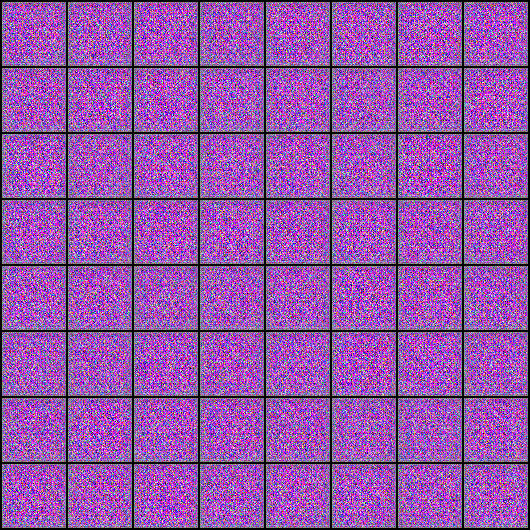

In [ ]:
from IPython.display import Image
Image('/content/generated/generated-images-0000.png')

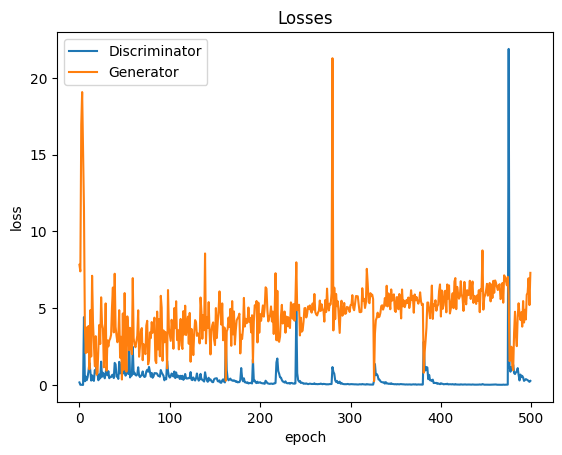

In [ ]:
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses');

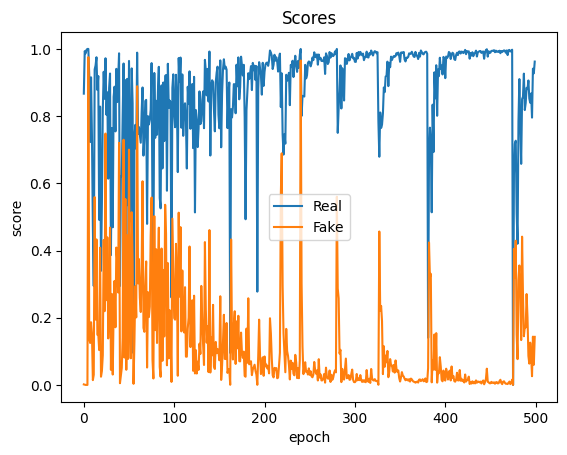

In [ ]:
plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('epoch')
plt.ylabel('score')
plt.legend(['Real', 'Fake'])
plt.title('Scores');

Real Images
Fake Images


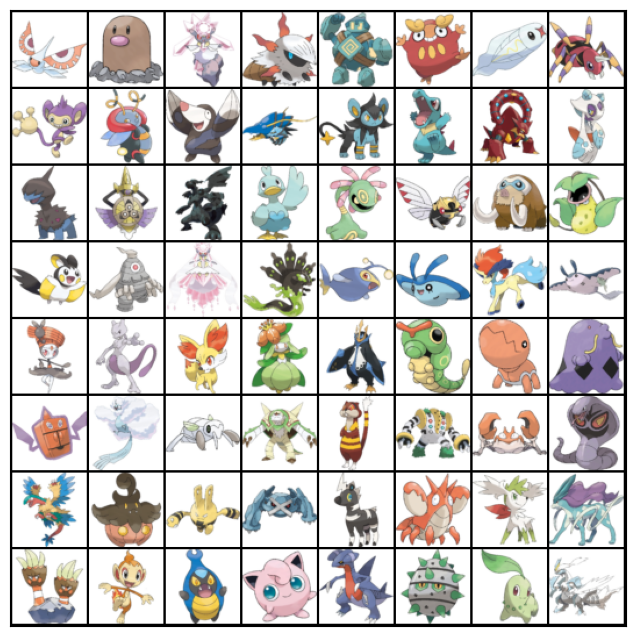

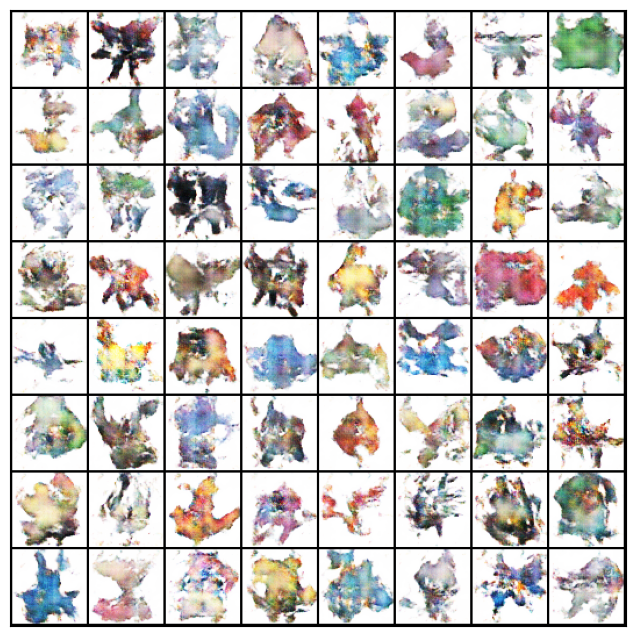

In [ ]:
real_images, _ = next(iter(train_dl))

with torch.no_grad():
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

print("Real Images")
show_images(real_images.cpu())

print("Fake Images")
show_images(fake_images.cpu())

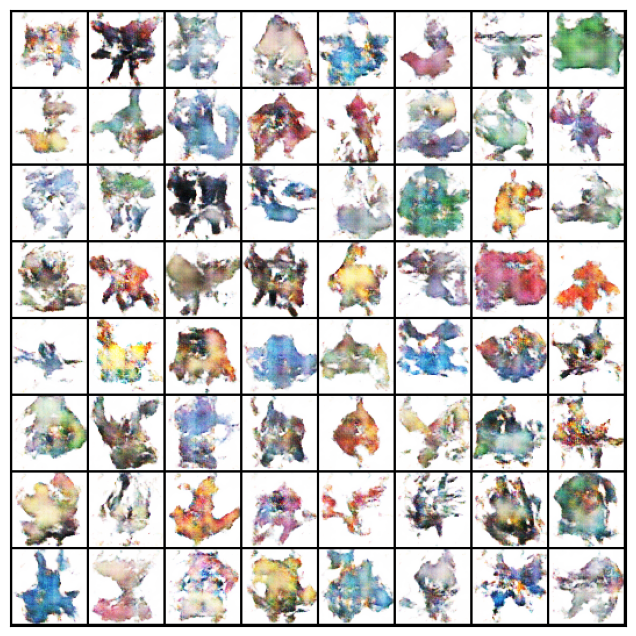